In [ ]:
from google.colab import files
uploaded=files.upload()
print(uploaded)

Saving Real Estate Data V21.csv to Real Estate Data V21.csv
{'Real Estate Data V21.csv': b'Name,Property Title,Price,Location,Total_Area,Price_per_SQFT,Description,Baths,Balcony\r\nCasagrand ECR 14,"4 BHK Flat for sale in Kanathur Reddikuppam, Chennai",\xe2\x82\xb91.99 Cr,"Kanathur Reddikuppam, Chennai",2583,7700.0,"Best 4 BHK Apartment for modern-day lifestyle is now available for sale. No brokerage involved, Posted by Owner. Grab this 4 BHK property for sale in one of Chennai\'s top location, Kanathur Reddikuppam. It is situated on floor 13. The total number of floors in this Apartment is 14. The property price of this unit is Rs 1.99 Cr. The built-up area is 2583 Square feet. There are 4 bedrooms and 4 bathroom. It is an ideal location for young families with kids, as this property is close to Mount Litera Zee School, OMR, Chennai, Amelio Early Education - Siruseri, and Chennai Mathematical Institute. H...",4,Yes\r\n"Ramanathan Nagar, Pozhichalur,Chennai","10 BHK Independent House f

In [ ]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv("/content/Real Estate Data V21.csv")  #load the dataset

In [ ]:
df.shape# it gives the no of rows and columns

(14528, 9)

In [ ]:
df.columns#it gives the columns names

Index(['Name', 'Property Title', 'Price', 'Location', 'Total_Area',
       'Price_per_SQFT', 'Description', 'Baths', 'Balcony'],
      dtype='object')

In [ ]:
df.dtypes #it gives the datatypes

,0
Name,object
Property Title,object
Price,object
Location,object
Total_Area,int64
Price_per_SQFT,float64
Description,object
Baths,int64
Balcony,object


In [ ]:
df.isnull().sum()# it is used to give the count the null values so that in future we can handle mssing values

,0
Name,0
Property Title,0
Price,0
Location,0
Total_Area,0
Price_per_SQFT,0
Description,0
Baths,0
Balcony,0


In [ ]:
df.head(5)# gives the top 5 records

,Name,Property Title,Price,Location,Total_Area,Price_per_SQFT,Description,Baths,Balcony
0,Casagrand ECR 14,"4 BHK Flat for sale in Kanathur Reddikuppam, C...",₹1.99 Cr,"Kanathur Reddikuppam, Chennai",2583,7700.0,Best 4 BHK Apartment for modern-day lifestyle ...,4,Yes
1,"Ramanathan Nagar, Pozhichalur,Chennai",10 BHK Independent House for sale in Pozhichal...,₹2.25 Cr,"Ramanathan Nagar, Pozhichalur,Chennai",7000,3210.0,Looking for a 10 BHK Independent House for sal...,6,Yes
2,DAC Prapthi,"3 BHK Flat for sale in West Tambaram, Chennai",₹1.0 Cr,"Kasthuribai Nagar, West Tambaram,Chennai",1320,7580.0,"Property for sale in Tambaram, Chennai. This 3...",3,No
3,"Naveenilaya,Chepauk, Triplicane,Chennai",7 BHK Independent House for sale in Triplicane...,₹3.33 Cr,"Naveenilaya,Chepauk, Triplicane,Chennai",4250,7840.0,Entire Building for sale with 7 units of singl...,5,Yes
4,VGN Spring Field Phase 1,"2 BHK Flat for sale in Avadi, Chennai",₹48.0 L,"Avadi, Chennai",960,5000.0,"Property for sale in Avadi, Chennai. This 2 BH...",3,Yes


In [ ]:
df.describe()# statistics like mean median

,Total_Area,Price_per_SQFT,Baths
count,14528.000000,14528.000000,14528.000000
mean,1297.916988,11719.456222,2.751239
std,1245.694305,49036.068632,0.898243
min,70.000000,0.000000,1.000000
25%,650.000000,4480.000000,2.000000
50%,1000.000000,6050.000000,3.000000
75%,1439.000000,9312.500000,3.000000
max,35000.000000,999000.000000,6.000000


In [ ]:
df.describe(include='object')

,Name,Property Title,Price,Location,Description,Balcony
count,14528,14528,14528,14528,14528,14528
unique,9998,6507,891,7050,14490,2
top,Classic Apartment,"2 BHK Flat for sale in Electronic City, Bangalore",₹60.0 L,"Sector 12 Dwarka, New Delhi",Sukhwani Landmarks has lauched Sukhwani Nysa i...,Yes
freq,42,53,407,44,5,8580


In [ ]:
for col in df.columns:#loops  throuh each column
    if df[col].dtype in ['int64', 'float64']: # if its numeric replace with median
        df[col] = df[col].fillna(df[col].median())
    else:
        df[col] = df[col].fillna(df[col].mode()[0]) #else if they are categorical replace the missing values with mode


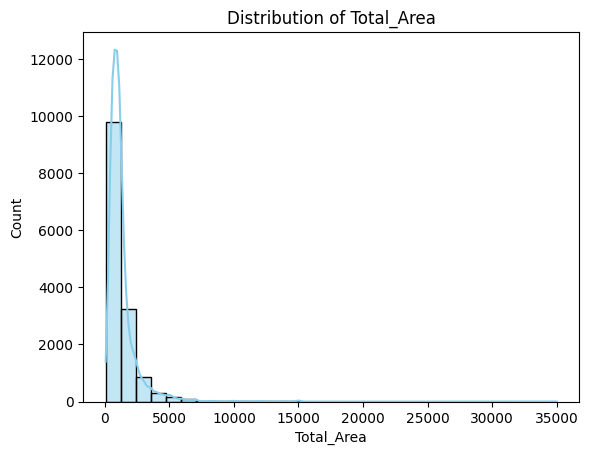

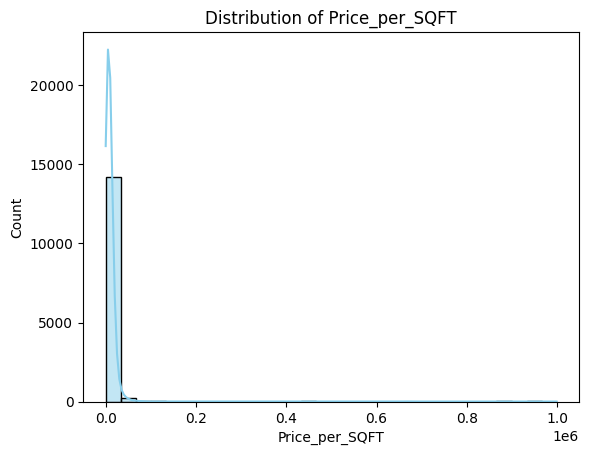

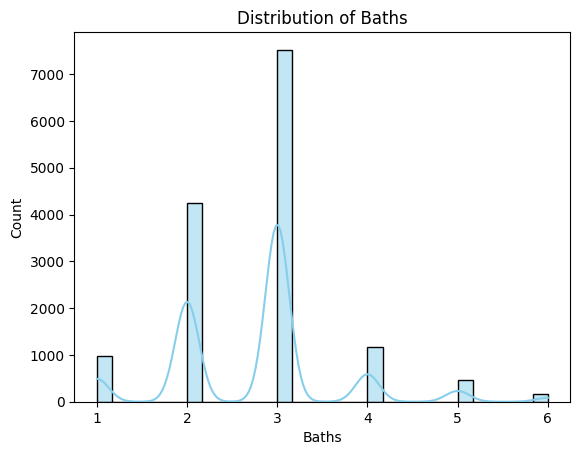

In [ ]:
numeric_cols = df.select_dtypes(include=['int64','float64']).columns # selects columns which are of int and float
for col in numeric_cols:
    plt.figure()
    sns.histplot(df[col], kde=True, bins=30, color="skyblue")
    plt.title(f"Distribution of {col}")
    plt.show()#It makes a graph for each number column (like  Price and other numeric values ) showing which values are common and which are rare.


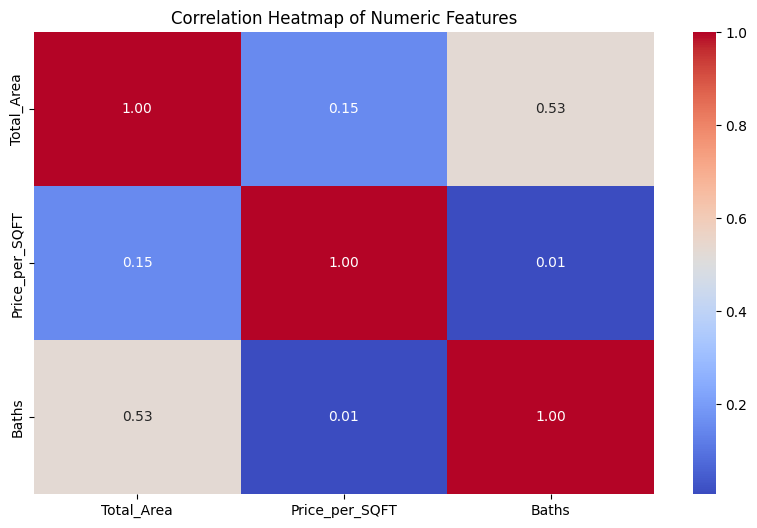

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap of Numeric Features")
plt.show()#Correlation Heatmap
#It shows how strongly each numeric column is related to the others (values range from -1 to +1)
#like +1 strong positive relation ,-1 strong negative and 0 no relation